# LetsGrowMoreVIP - Data Science Internship
## Beginner Level Task-4 - Image to Pencil Sketch with Python
## by Attar Asfiyan Nazim

# Importing the Libraries

In [1]:
import cv2
import numpy as np
import plotly.express as px

# Loading Images

In [2]:
img = cv2.imread(r'dog.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)


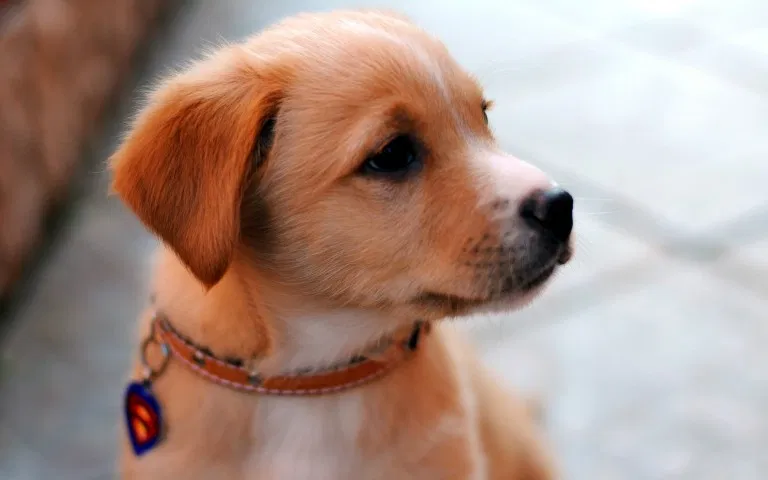

In [3]:
imgs=px.imshow(img)
#imgs.update_layout(width=990, height=600 ,margin=dict(l=20, r=20, b=10, t=10))
imgs.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
imgs.show()

# Resizing image shape

In [4]:
scale_percent = 0.60

In [5]:
width = int(img.shape[1]*scale_percent)
height = int(img.shape[0]*scale_percent)

In [6]:
dim = (width,height)
resized = cv2.resize(img,dim,interpolation = cv2.INTER_AREA)


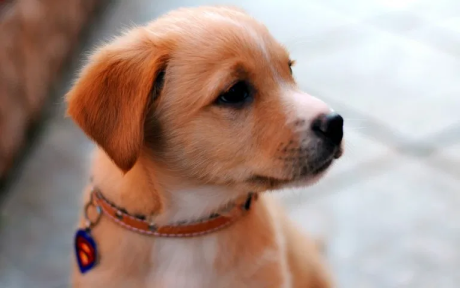

In [7]:
res=px.imshow(resized)
res.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
res.show()

# Sharpening Image

In [8]:
kernel_sharpening = np.array([[-1,-1,-1], 
                              [-1, 9,-1],
                              [-1,-1,-1]])
sharpened = cv2.filter2D(resized,-1,kernel_sharpening)


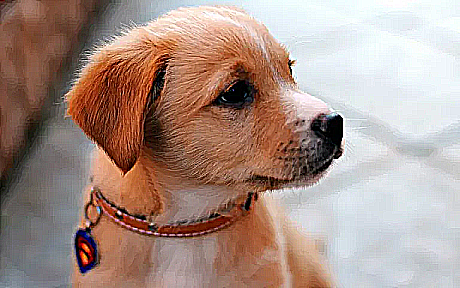

In [9]:
sharp=px.imshow(sharpened)
sharp.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
sharp.show()

# Converting an image into gray_scale image

In [10]:
grayscale = cv2.cvtColor(sharpened , cv2.COLOR_BGR2GRAY)

In [11]:
gray = px.imshow(grayscale, color_continuous_scale='gray')
gray.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
gray.show()

# Inverting the image

In [12]:
invs = 255-grayscale

In [13]:
inv=px.imshow(invs,color_continuous_scale='gray')
inv.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
inv.show()

# Smoothing the image

In [14]:
gauss = cv2.GaussianBlur(invs,ksize=(15,15),sigmaX=0,sigmaY=0)

In [15]:
gaus=px.imshow(gauss,color_continuous_scale='gray')
gaus.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
gaus.show()

# Obtaining the final sketch

In [16]:
def dodgeV2(image,mask):
    return cv2.divide(image,255-mask,scale=256)

pencil_img = dodgeV2(grayscale,gauss)

In [17]:
sketch=px.imshow(pencil_img,color_continuous_scale='gray')
#sketch.update_layout(width=990, height=600 ,margin=dict(l=20, r=20, b=10, t=10))
sketch.update_layout(coloraxis_showscale=False)
sketch.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
sketch.show()